In [1]:
import pandas as pd
import numpy as np
import os
import glob
import mne
import neo


In [2]:
cwd = os.getcwd()
print(cwd)
listOfFiles = sorted(glob.glob("NASA*.txt"))
print(len(listOfFiles))
behav_data = pd.read_csv('BehavioralData.txt')

/Users/molfesepj/Desktop/EEG_DATA/NASA_6x25_OHBM2019
2088


In [3]:
behav_data.head()

,subject,group
0,108m,1hr
1,109f,1hr
2,110m,1hr
3,114m,1hr
4,123f,1hr


In [240]:
from tqdm import tqdm
mydata = []
ct = len(listOfFiles)


for indx in tqdm(range(0,ct)):
    aFile = listOfFiles[indx]
    subID = aFile.split("_")[1]
    cond = aFile.split("_")[3]
    stim = aFile.split("_")[5].split(".txt")[0]
    
    eeg_data = pd.read_csv(aFile, sep = '\t', header=None)
    
    #fix the really annoying condition typos:
    if "1HDT" in cond:
        cond = '1HDT'
    if "1U" in cond:
        cond = "1U"
    if "2HDT" in cond:
        cond = "2HDT"
    if "2U" in cond:
        cond = "2U"
    
    mydata.append(eeg_data.assign(Subject = subID, Condition=cond, Stimulus=stim, TP=np.arange(250)))

100%|██████████| 2088/2088 [00:44<00:00, 47.27it/s]


In [241]:
mydata[0].shape

(250, 261)

In [242]:
#concatenate to one long dataframe
df = pd.concat(mydata)
df = df.merge(behav_data, left_on='Subject', right_on='subject' )

In [243]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,253,254,255,256,Subject,Condition,Stimulus,TP,subject,group
0,-2.098813,-1.787315,-1.017317,-0.646760,-0.689496,-0.532122,0.031831,0.125043,0.059748,-2.143487,...,1.691227,1.617426,1.209030,-0.085132,001m,1HDT,Ba,0,001m,control
1,-2.274852,-1.920565,-1.196043,-0.592975,-0.622230,-0.506785,0.120897,0.332476,0.369176,-2.207146,...,1.338553,1.190324,0.865841,0.165842,001m,1HDT,Ba,1,001m,control
2,-2.315788,-1.918868,-1.200985,-0.565939,-0.556711,-0.528719,0.126444,0.421873,0.515595,-2.185226,...,0.885051,0.664076,0.464371,0.289958,001m,1HDT,Ba,2,001m,control
3,-2.276556,-1.852831,-1.042926,-0.591222,-0.533349,-0.592982,0.060211,0.373489,0.483648,-1.842759,...,0.392565,0.117029,0.039599,0.289189,001m,1HDT,Ba,3,001m,control
4,-2.172894,-1.744687,-0.788171,-0.662456,-0.557835,-0.659162,-0.035194,0.224943,0.324252,-1.819660,...,-0.064156,-0.363840,-0.369046,0.209096,001m,1HDT,Ba,4,001m,control


In [244]:
df.drop(df[df.group=='NaN'].index)
df.head()

,0,1,2,3,4,5,6,7,8,9,...,253,254,255,256,Subject,Condition,Stimulus,TP,subject,group
0,-2.098813,-1.787315,-1.017317,-0.646760,-0.689496,-0.532122,0.031831,0.125043,0.059748,-2.143487,...,1.691227,1.617426,1.209030,-0.085132,001m,1HDT,Ba,0,001m,control
1,-2.274852,-1.920565,-1.196043,-0.592975,-0.622230,-0.506785,0.120897,0.332476,0.369176,-2.207146,...,1.338553,1.190324,0.865841,0.165842,001m,1HDT,Ba,1,001m,control
2,-2.315788,-1.918868,-1.200985,-0.565939,-0.556711,-0.528719,0.126444,0.421873,0.515595,-2.185226,...,0.885051,0.664076,0.464371,0.289958,001m,1HDT,Ba,2,001m,control
3,-2.276556,-1.852831,-1.042926,-0.591222,-0.533349,-0.592982,0.060211,0.373489,0.483648,-1.842759,...,0.392565,0.117029,0.039599,0.289189,001m,1HDT,Ba,3,001m,control
4,-2.172894,-1.744687,-0.788171,-0.662456,-0.557835,-0.659162,-0.035194,0.224943,0.324252,-1.819660,...,-0.064156,-0.363840,-0.369046,0.209096,001m,1HDT,Ba,4,001m,control


In [245]:
df.shape

(450000, 263)

In [304]:
#test = df.groupby(['group','Condition','Stimulus','TP']).mean()
test = df.groupby(['Condition','Stimulus','TP']).mean()
test.head()

0         1         2         3         4    \
Condition Stimulus TP                                                     
1HDT      Ba       0  -0.104856 -0.098460 -0.200951 -0.156567 -0.155658   
                   1  -0.031041 -0.024613 -0.061086 -0.019956 -0.074183   
                   2   0.041278  0.053055  0.065418  0.104983 -0.003932   
                   3   0.110731  0.119266  0.144383  0.173949  0.037511   
                   4   0.164340  0.163328  0.164635  0.169720  0.043731   

                            5         6         7         8         9    \
Condition Stimulus TP                                                     
1HDT      Ba       0  -0.123559 -0.102117 -0.043618 -0.055900 -0.130994   
                   1  -0.080210 -0.071522 -0.028351 -0.056046 -0.019580   
                   2  -0.049040 -0.048950 -0.017330 -0.057507  0.075214   
                   3  -0.035741 -0.038922 -0.013684 -0.058440  0.140763   
                   4  -0.036195 -0.038726 -0.015411 -0.054742  0.160007   

                         ...          247       248       249       250  \
Condition Stimulus TP    ...                                              
1HDT      Ba       0     ...     0.045411  0.060930  0.062746  0.054980   
                   1     ...     0.088432  0.092241  0.077186  0.060141   
                   2     ...     0.114287  0.103647  0.084373  0.062075   
                   3     ...     0.122066  0.099779  0.089356  0.070285   
                   4     ...     0.116661  0.088662  0.095501  0.085969   

                            251       252       253       254       255  \
Condition Stimulus TP                                                     
1HDT      Ba       0   0.064361  0.125471  0.025245  0.173562  0.097083   
                   1   0.095020  0.131368  0.044234  0.168207  0.098395   
                   2   0.110493  0.137786  0.058787  0.153479  0.099796   
                   3   0.124568  0.149833  0.071826  0.136418  0.101075   
                   4   0.126693  0.154607  0.084190  0.120780  0.100033   

                            256  
Condition Stimulus TP            
1HDT      Ba       0  -0.079283  
                   1  -0.080395  
                   2  -0.087805  
                   3  -0.096624  
                   4  -0.099098  

[5 rows x 257 columns]

In [305]:
test.shape

(6000, 257)

In [306]:
df = test.reset_index()

In [307]:
df.head()

,Condition,Stimulus,TP,0,1,2,3,4,5,6,...,247,248,249,250,251,252,253,254,255,256
0,1HDT,Ba,0,-0.104856,-0.098460,-0.200951,-0.156567,-0.155658,-0.123559,-0.102117,...,0.045411,0.060930,0.062746,0.054980,0.064361,0.125471,0.025245,0.173562,0.097083,-0.079283
1,1HDT,Ba,1,-0.031041,-0.024613,-0.061086,-0.019956,-0.074183,-0.080210,-0.071522,...,0.088432,0.092241,0.077186,0.060141,0.095020,0.131368,0.044234,0.168207,0.098395,-0.080395
2,1HDT,Ba,2,0.041278,0.053055,0.065418,0.104983,-0.003932,-0.049040,-0.048950,...,0.114287,0.103647,0.084373,0.062075,0.110493,0.137786,0.058787,0.153479,0.099796,-0.087805
3,1HDT,Ba,3,0.110731,0.119266,0.144383,0.173949,0.037511,-0.035741,-0.038922,...,0.122066,0.099779,0.089356,0.070285,0.124568,0.149833,0.071826,0.136418,0.101075,-0.096624
4,1HDT,Ba,4,0.164340,0.163328,0.164635,0.169720,0.043731,-0.036195,-0.038726,...,0.116661,0.088662,0.095501,0.085969,0.126693,0.154607,0.084190,0.120780,0.100033,-0.099098


In [308]:
#for aStim in ['Ba','Da','Ga','Bu','Du','Gu']:

mydata = []

#for aGroup in ['1hr','3hr','control']:
#    for aCond in ['1HDT','2HDT','1U','2U']:
#        qdata = df.query('group == "{}"'.format(aGroup)).query('Condition == "{}"'.format(aCond))
#        mydata.append( qdata )
        
mydata = []
        
for aCond in ['1HDT','2HDT','1U','2U']:
    for aStim in ['Ba','Bu','Da','Du','Ga','Gu']:
        qdata = df.query('Stimulus == "{}"'.format(aStim)).query('Condition == "{}"'.format(aCond))
        mydata.append( qdata )
                                                                   
                                                                   

In [309]:
len(mydata) #should be 72 with everything or 12 (4*3) since we left out stimulus or 24 (6x4) without group

24

In [312]:
print(mydata[0].shape)
mydata[0].head()

(250, 260)


,Condition,Stimulus,TP,0,1,2,3,4,5,6,...,247,248,249,250,251,252,253,254,255,256
0,1HDT,Ba,0,-0.104856,-0.098460,-0.200951,-0.156567,-0.155658,-0.123559,-0.102117,...,0.045411,0.060930,0.062746,0.054980,0.064361,0.125471,0.025245,0.173562,0.097083,-0.079283
1,1HDT,Ba,1,-0.031041,-0.024613,-0.061086,-0.019956,-0.074183,-0.080210,-0.071522,...,0.088432,0.092241,0.077186,0.060141,0.095020,0.131368,0.044234,0.168207,0.098395,-0.080395
2,1HDT,Ba,2,0.041278,0.053055,0.065418,0.104983,-0.003932,-0.049040,-0.048950,...,0.114287,0.103647,0.084373,0.062075,0.110493,0.137786,0.058787,0.153479,0.099796,-0.087805
3,1HDT,Ba,3,0.110731,0.119266,0.144383,0.173949,0.037511,-0.035741,-0.038922,...,0.122066,0.099779,0.089356,0.070285,0.124568,0.149833,0.071826,0.136418,0.101075,-0.096624
4,1HDT,Ba,4,0.164340,0.163328,0.164635,0.169720,0.043731,-0.036195,-0.038726,...,0.116661,0.088662,0.095501,0.085969,0.126693,0.154607,0.084190,0.120780,0.100033,-0.099098


In [280]:
mydata[0][3].max()

2.2162038333333327

In [315]:
'_'.join(mydata[0].iloc[0,0:2].values) #was previously to 3 for the condition 
#print('_'.join(mydata[0].iloc[iloc[:3]]))

'1HDT_Ba'

In [320]:
mydata[0].iloc[0,0:2].values

array(['1HDT', 'Ba'], dtype=object)

In [325]:
allEEGdata = []
EEGnames = []

for splitData in mydata:
    #setup info for the dataframe, name, and get rid of unnecessary columns
    #subject_info = '_'.join(splitData.iloc[0,0:2].values) #selects which columns to keep for naming
    subject_info = '_'.join(splitData.iloc[0,0:2].values)
    #EEGnames.append('_'.join(splitData.iloc[0,0:2].values))
    EEGnames.append(subject_info)
                    
    #tmpdata = splitData.drop(columns=['group','Condition','TP']) #used to have stimulus as well
    tmpdata = splitData.drop(columns=['Condition','TP', 'Stimulus'])
    
    #create a header & make an MNE dataset
    sfreq = 250
    times = np.arange(0,900,4)
    ch_types = ['eeg']*257
    ch_names = list( np.char.mod('E%d', np.arange(1,257) ) )
    ch_names.append('Cz')
    info = mne.create_info(ch_names = ch_names, sfreq=sfreq, ch_types=ch_types, montage='GSN-HydroCel-257')
    
    #create events since this is already averaged data
    events = np.array([1])
    event_id = dict( {subject_info : 1 })
    tmin = -0.1
    nave = 1
    comment = subject_info
    my_evoked_data = mne.EvokedArray(np.transpose( (tmpdata.values) /1000000), info, tmin, comment=comment)
    
    
    #my_evoked_data = mne.EvokedArray(np.transpose(tmpdata.values), info, tmin, comment=comment, nave=nave)
    allEEGdata.append(my_evoked_data)

In [326]:
allEEGdata[1].to_data_frame()

Converting "time" to "<class 'numpy.int64'>"...


channel,E1,E2,E3,E4,E5,E6,E7,E8,E9,E10,...,E248,E249,E250,E251,E252,E253,E254,E255,E256,Cz
time,,,,,,,,,,,,,,,,,,,,,
-100,-0.054013,-0.037064,0.061760,0.058159,-0.065759,-0.046929,-0.059098,-0.024454,-0.059824,-0.107574,...,-0.085773,-0.111469,-0.044437,-0.044722,-0.131727,-0.054694,-0.024844,-0.009810,0.035172,-0.029513
-96,-0.093616,-0.119752,-0.032405,-0.017467,-0.144159,-0.127849,-0.125208,-0.087958,-0.104716,-0.143643,...,-0.056296,-0.097423,-0.036792,-0.030632,-0.119859,-0.048329,-0.021578,0.000755,0.043311,-0.068873
-92,-0.143737,-0.204758,-0.148104,-0.119031,-0.212295,-0.194365,-0.176351,-0.134010,-0.133719,-0.186037,...,-0.026072,-0.074756,-0.033076,-0.023864,-0.097734,-0.035663,0.000020,0.009064,0.043450,-0.096913
-88,-0.196992,-0.271304,-0.256278,-0.226132,-0.255580,-0.235118,-0.206273,-0.154540,-0.143051,-0.230458,...,-0.011774,-0.055484,-0.037477,-0.020397,-0.074286,-0.019711,0.027379,0.012820,0.031509,-0.108542
-84,-0.228369,-0.299394,-0.323673,-0.305638,-0.264061,-0.244871,-0.212920,-0.148560,-0.134168,-0.258436,...,-0.021441,-0.048556,-0.052149,-0.032888,-0.062710,-0.010293,0.044535,0.009317,0.012801,-0.102916
-80,-0.231329,-0.275808,-0.323552,-0.326140,-0.233963,-0.224157,-0.197231,-0.121406,-0.111967,-0.260590,...,-0.049269,-0.054164,-0.070940,-0.046745,-0.066852,-0.011893,0.040283,-0.000440,-0.009047,-0.083098
-76,-0.187710,-0.201598,-0.250377,-0.273535,-0.171017,-0.180273,-0.164276,-0.084292,-0.084745,-0.217468,...,-0.079252,-0.064551,-0.085768,-0.050644,-0.082050,-0.024745,0.014911,-0.013759,-0.026216,-0.056964
-72,-0.094528,-0.093246,-0.123170,-0.160574,-0.089873,-0.125088,-0.122079,-0.050589,-0.061606,-0.131035,...,-0.092671,-0.067650,-0.086923,-0.035981,-0.094980,-0.042203,-0.019891,-0.022169,-0.033699,-0.034585
-68,0.017481,0.023374,0.019414,-0.022122,-0.009710,-0.070963,-0.079102,-0.030699,-0.048870,-0.024081,...,-0.075815,-0.052062,-0.067670,-0.008111,-0.090205,-0.053590,-0.044344,-0.020901,-0.026727,-0.023996


In [327]:
EEGnames

['1HDT_Ba',
 '1HDT_Bu',
 '1HDT_Da',
 '1HDT_Du',
 '1HDT_Ga',
 '1HDT_Gu',
 '2HDT_Ba',
 '2HDT_Bu',
 '2HDT_Da',
 '2HDT_Du',
 '2HDT_Ga',
 '2HDT_Gu',
 '1U_Ba',
 '1U_Bu',
 '1U_Da',
 '1U_Du',
 '1U_Ga',
 '1U_Gu',
 '2U_Ba',
 '2U_Bu',
 '2U_Da',
 '2U_Du',
 '2U_Ga',
 '2U_Gu']

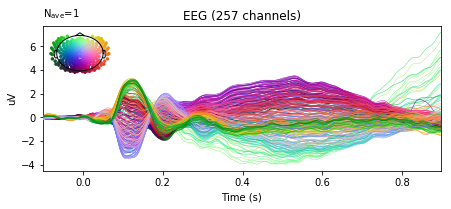

Figure(460.8x216)


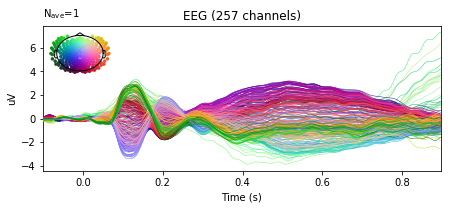

Figure(460.8x216)


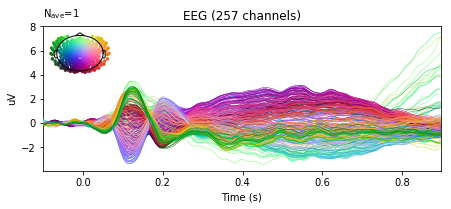

Figure(460.8x216)


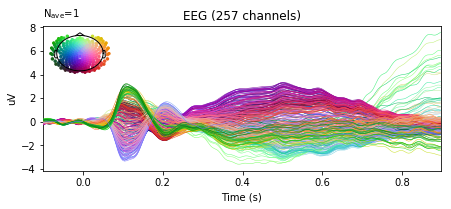

Figure(460.8x216)


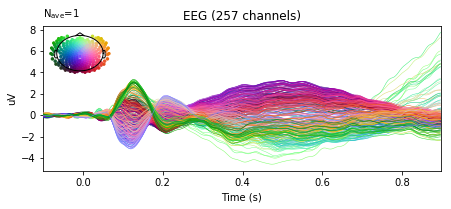

Figure(460.8x216)


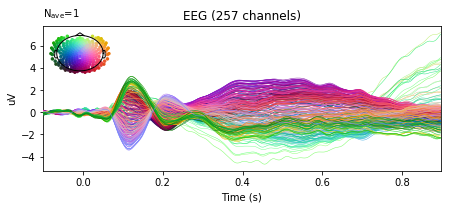

Figure(460.8x216)


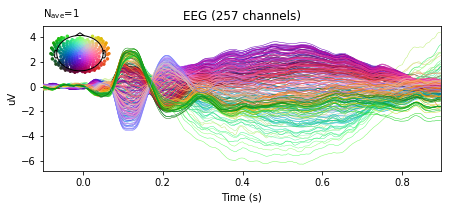

Figure(460.8x216)


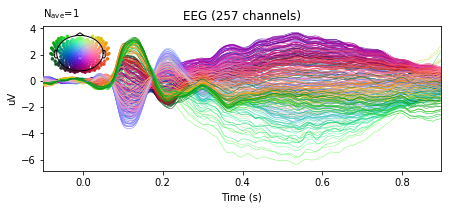

Figure(460.8x216)


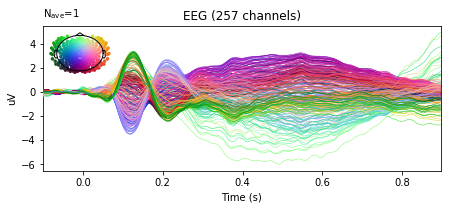

Figure(460.8x216)


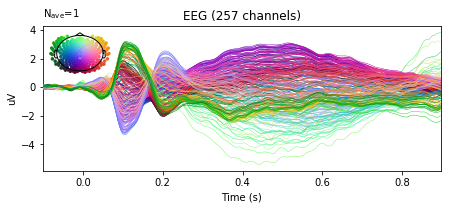

Figure(460.8x216)


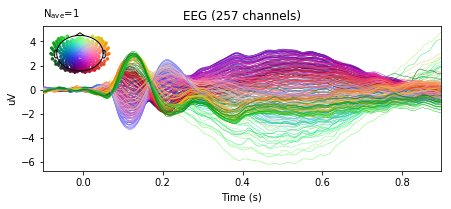

Figure(460.8x216)


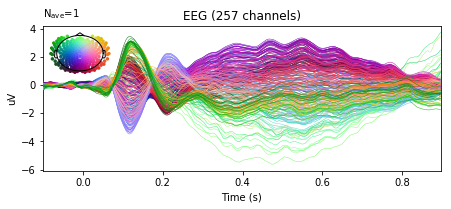

Figure(460.8x216)


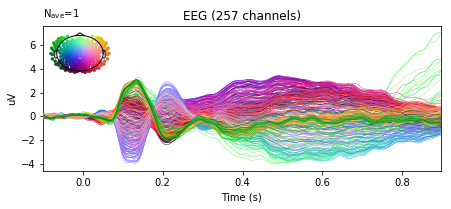

Figure(460.8x216)


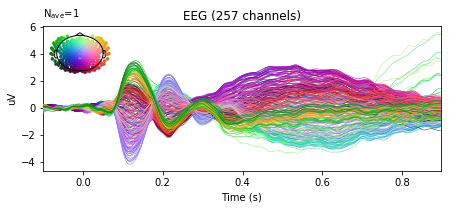

Figure(460.8x216)


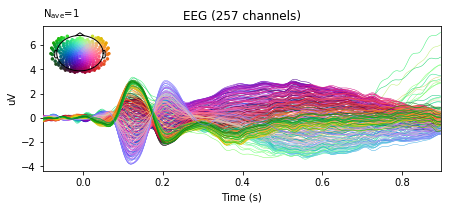

Figure(460.8x216)


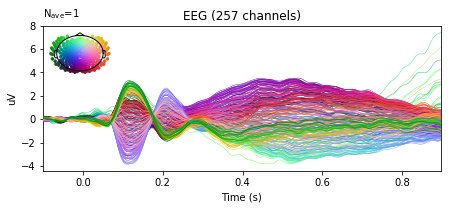

Figure(460.8x216)


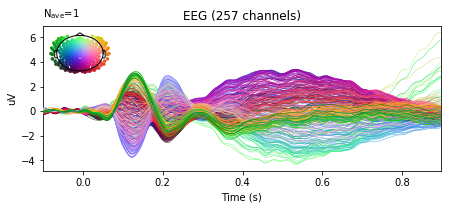

Figure(460.8x216)


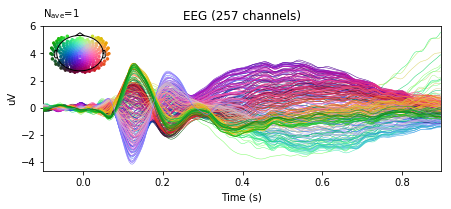

Figure(460.8x216)


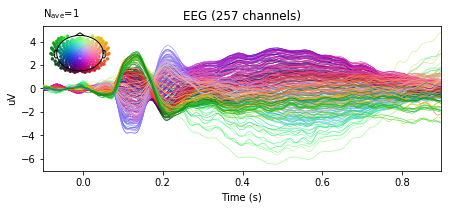

Figure(460.8x216)


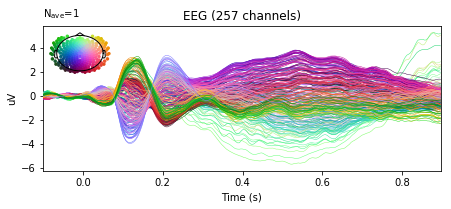

Figure(460.8x216)


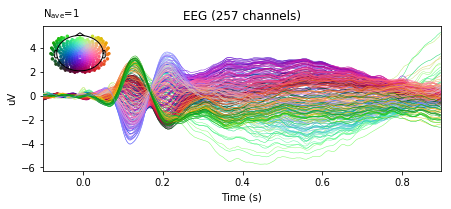

Figure(460.8x216)


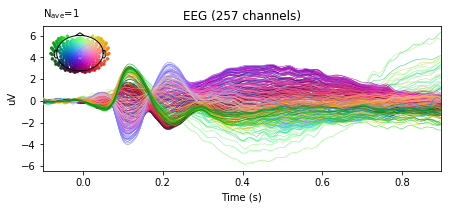

Figure(460.8x216)


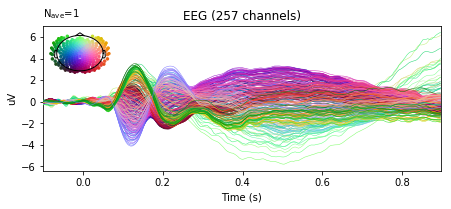

Figure(460.8x216)


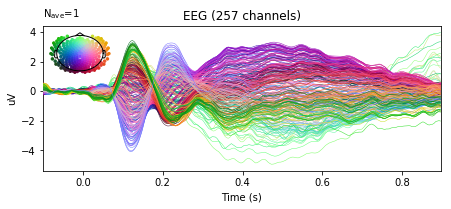

Figure(460.8x216)


In [328]:
#allEEGdata[0].plot(time_unit='s', spatial_colors=True)

ct=0

%matplotlib inline
for aSet in allEEGdata:
    myplot = aSet.plot(time_unit='s', spatial_colors=True)
    print(myplot)
    myplot.savefig("Fig1_" + EEGnames[ct] + ".png")
    ct += 1

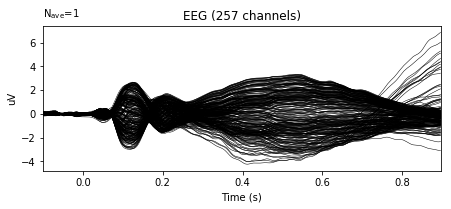

Figure(460.8x216)


In [104]:
print(allEEGdata[0].plot())

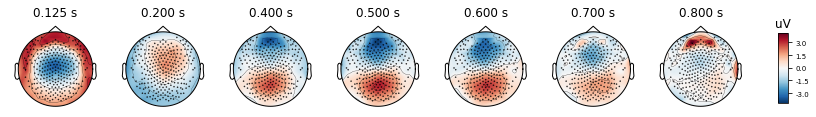

Figure(864x140.4)


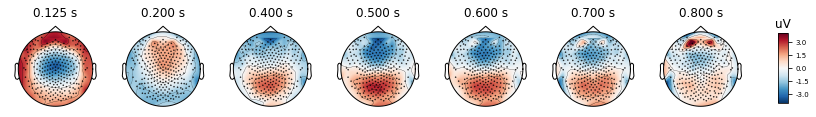

Figure(864x140.4)


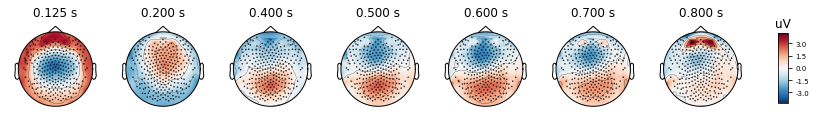

Figure(864x140.4)


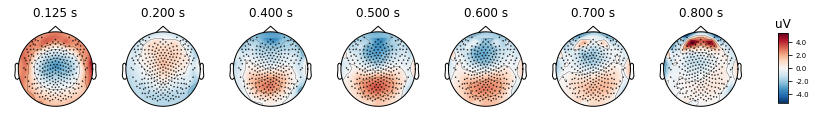

Figure(864x140.4)


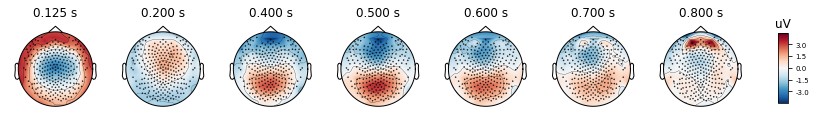

Figure(864x140.4)


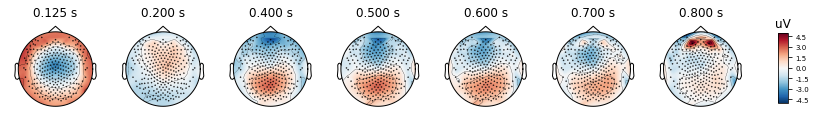

Figure(864x140.4)


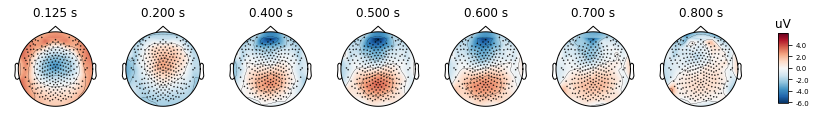

Figure(864x140.4)


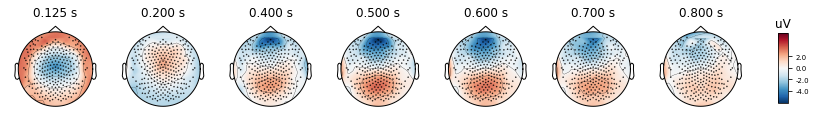

Figure(864x140.4)


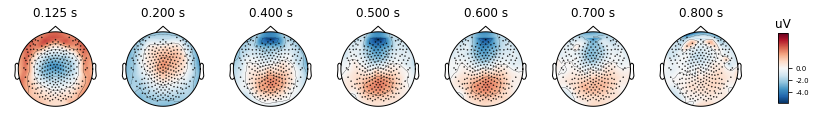

Figure(864x140.4)


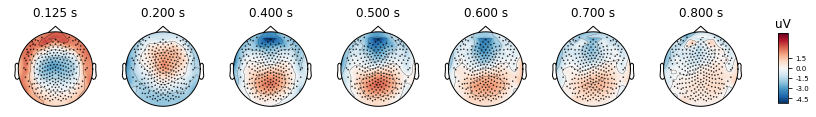

Figure(864x140.4)


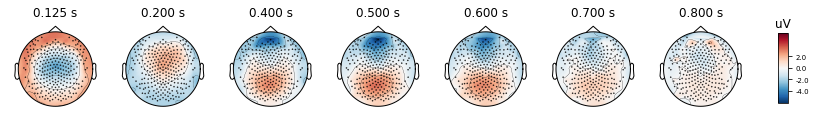

Figure(864x140.4)


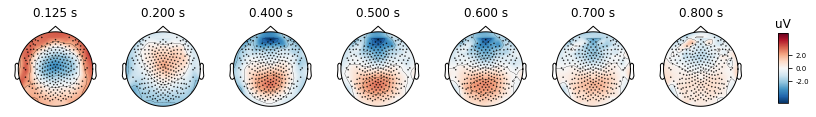

Figure(864x140.4)


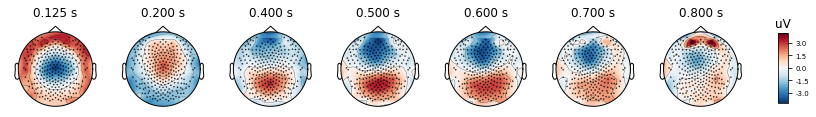

Figure(864x140.4)


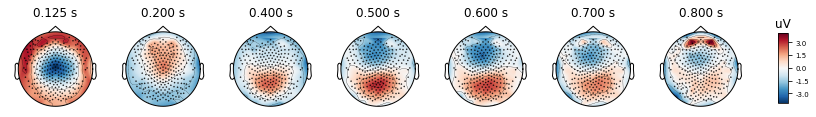

Figure(864x140.4)


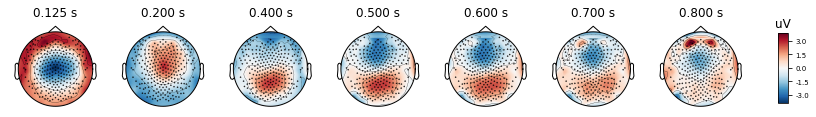

Figure(864x140.4)


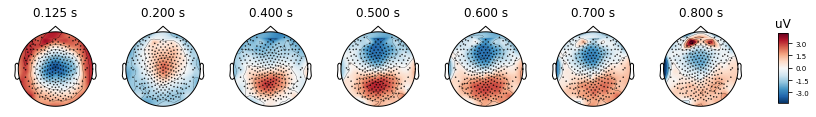

Figure(864x140.4)


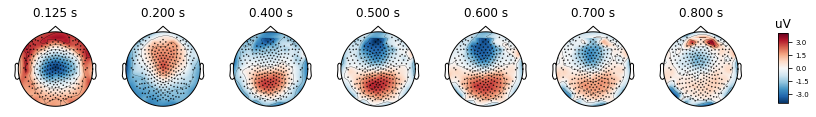

Figure(864x140.4)


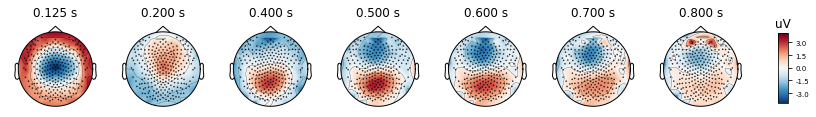

Figure(864x140.4)


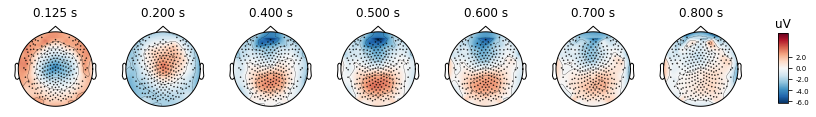

Figure(864x140.4)


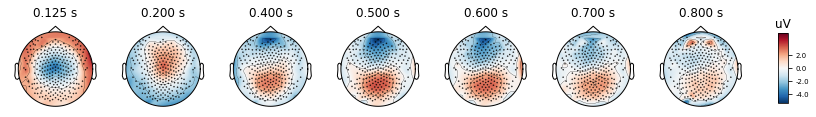

Figure(864x140.4)


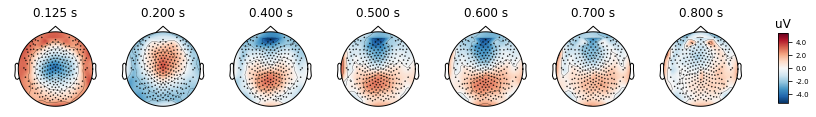

Figure(864x140.4)


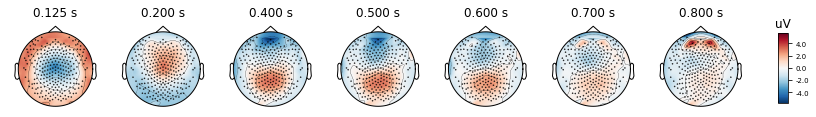

Figure(864x140.4)


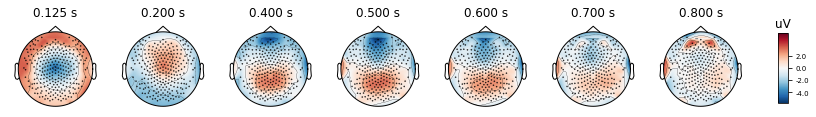

Figure(864x140.4)


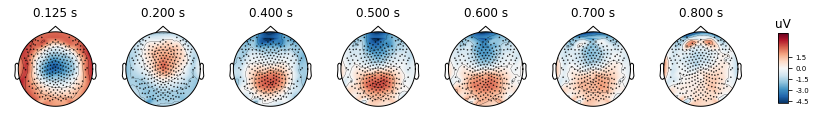

Figure(864x140.4)


In [329]:

%matplotlib inline
ct = 0

times = [0.125, 0.20, 0.4, 0.5, 0.6, 0.7, 0.8]
for aSet in allEEGdata:
    myplot = aSet.plot_topomap(times=times, ch_type='eeg', time_unit='s')
    print(myplot)
    myplot.savefig("Fig5_" + EEGnames[ct] + ".png")
    ct += 1


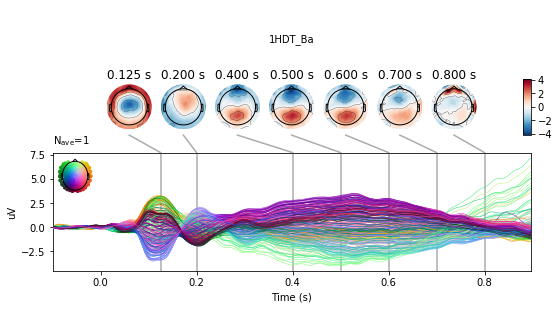

Figure(576x302.4)


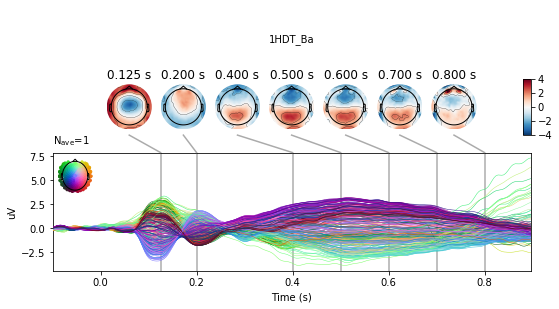

Figure(576x302.4)


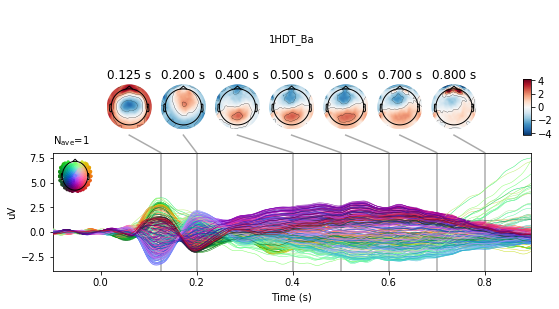

Figure(576x302.4)


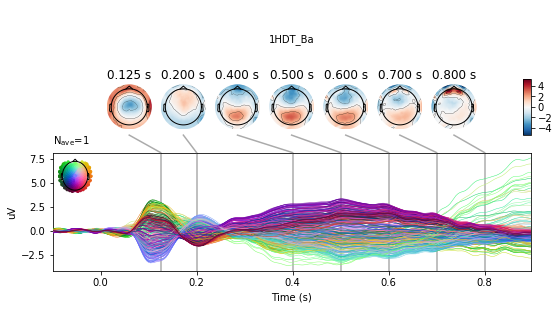

Figure(576x302.4)


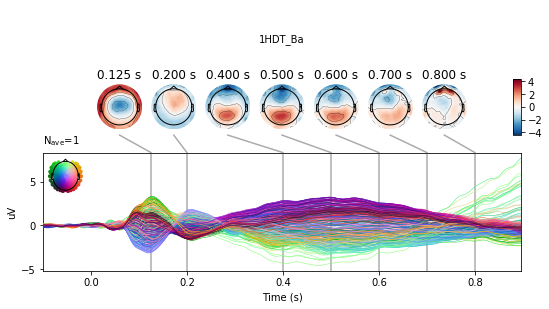

Figure(576x302.4)


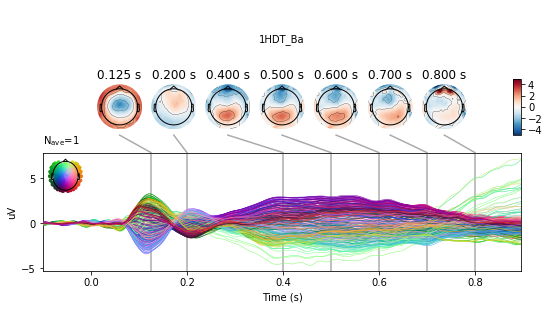

Figure(576x302.4)


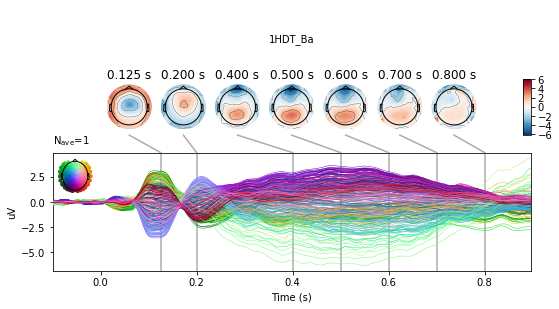

Figure(576x302.4)


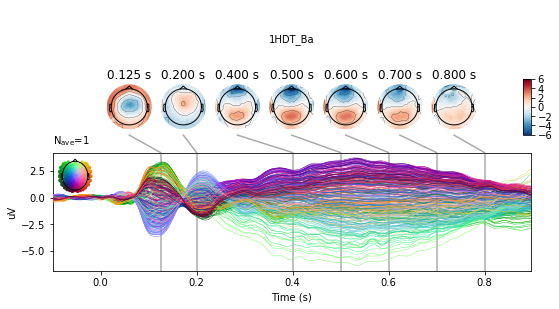

Figure(576x302.4)


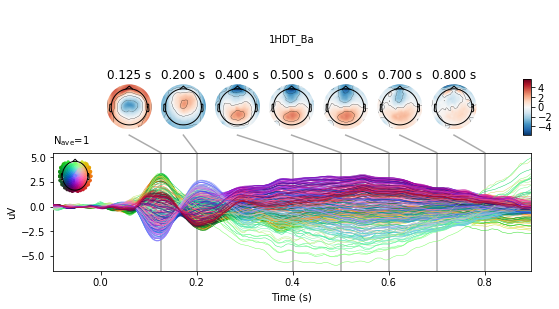

Figure(576x302.4)


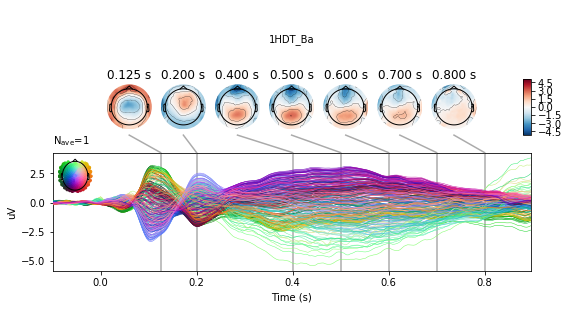

Figure(576x302.4)


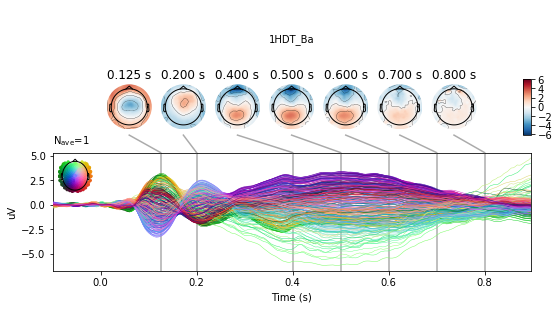

Figure(576x302.4)


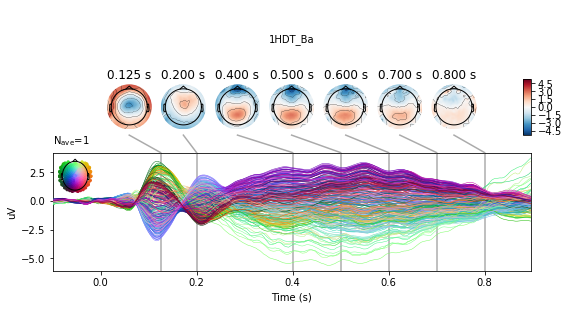

Figure(576x302.4)


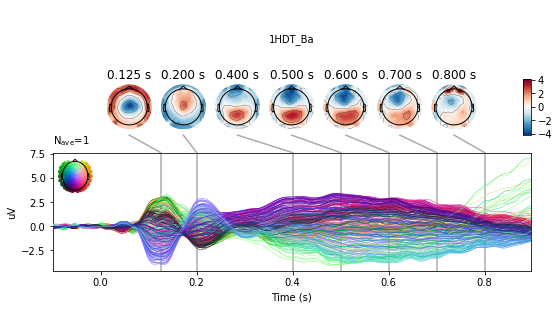

Figure(576x302.4)


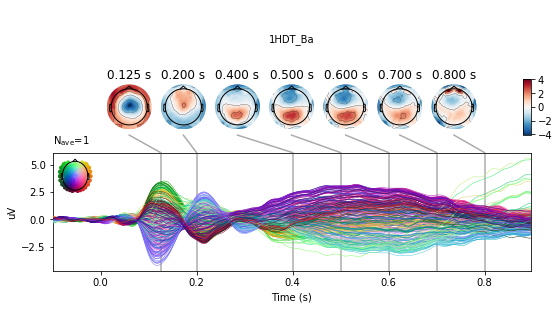

Figure(576x302.4)


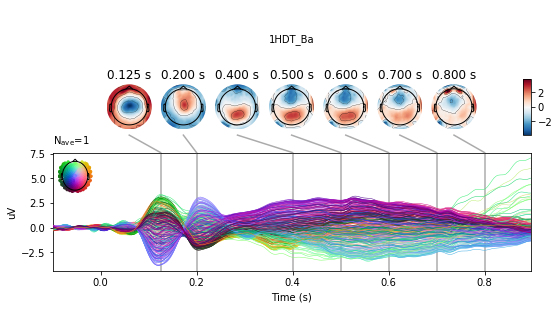

Figure(576x302.4)


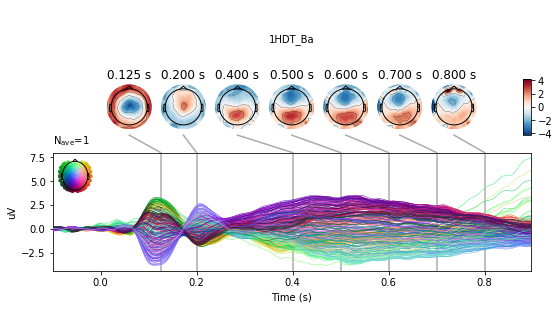

Figure(576x302.4)


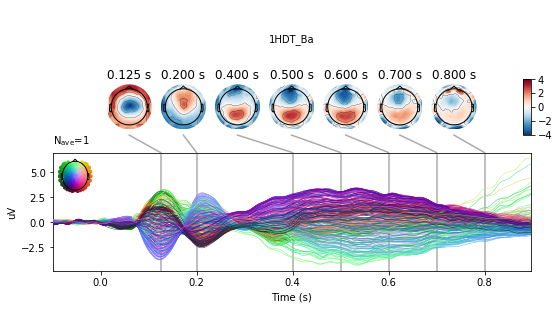

Figure(576x302.4)


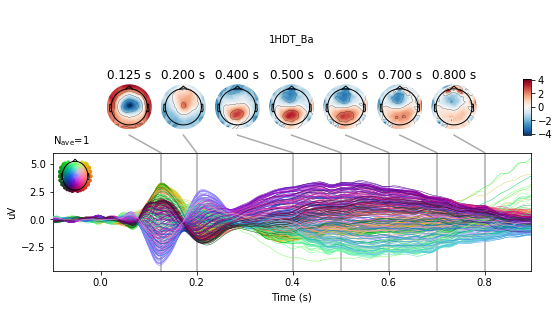

Figure(576x302.4)


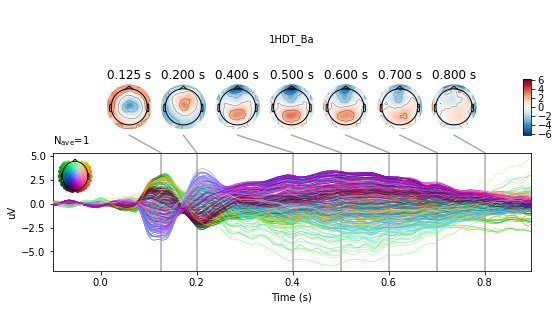

Figure(576x302.4)


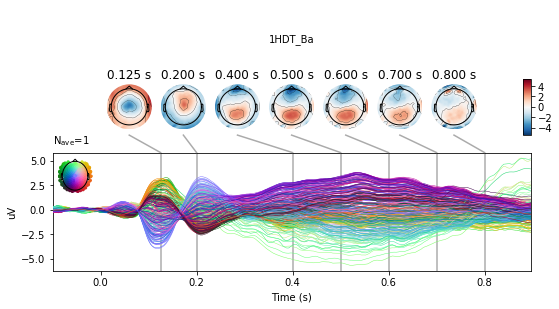

Figure(576x302.4)


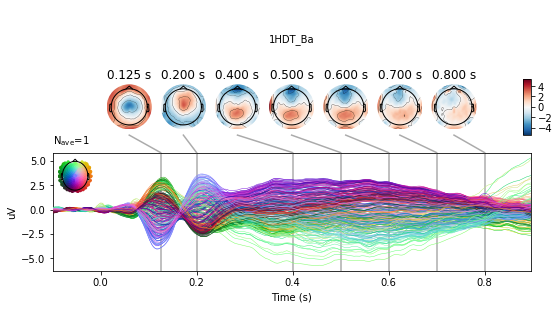

Figure(576x302.4)


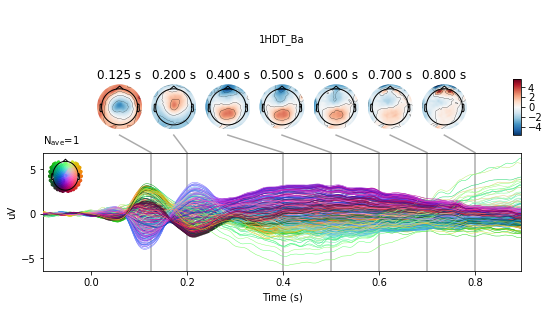

Figure(576x302.4)


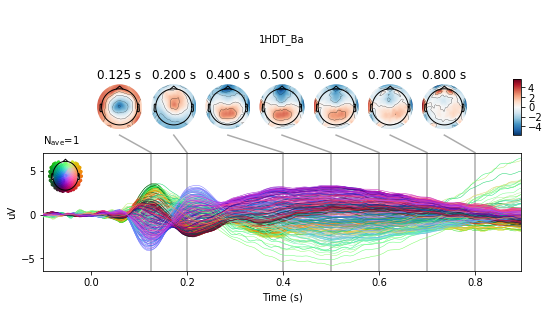

Figure(576x302.4)


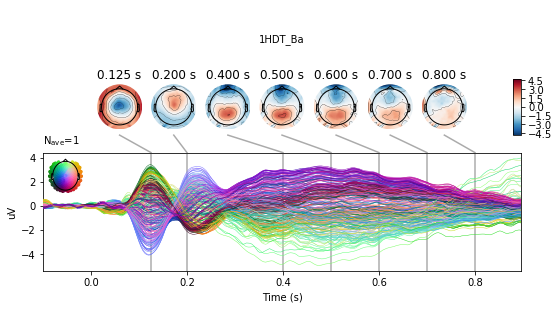

Figure(576x302.4)


In [330]:
%matplotlib inline

times = [0.125, 0.20, 0.4, 0.5, 0.6, 0.7, 0.8]
ts_args = dict(gfp=False, time_unit='s')
topomap_args = dict(sensors=False, time_unit='s')

ct = 0
for aSet in allEEGdata:
    myplot = aSet.plot_joint(title=allEEGdata[0].comment, times=times,
                        ts_args=ts_args, topomap_args=topomap_args)
    print(myplot)
    myplot.savefig("Fig6_" + EEGnames[ct] + ".png")
    ct += 1



In [209]:
print(len(EEGnames))
EEGnames

12


['1hr_1HDT',
 '1hr_2HDT',
 '1hr_1U',
 '1hr_2U',
 '3hr_1HDT',
 '3hr_2HDT',
 '3hr_1U',
 '3hr_2U',
 'control_1HDT',
 'control_2HDT',
 'control_1U',
 'control_2U']

In [147]:
# get the pickle file with our dictionary from other jupyter notebook (need to un-cludge this soon)
import pickle
mycomponents = pickle.load(open("EEG_PCA_Components_DICT.pkl", 'rb'))
mycomponents.keys()

dict_keys(['T0S0_Pos', 'T0S0_Neg', 'T0S1_Pos', 'T0S1_Neg', 'T0S2_Pos', 'T0S2_Neg', 'T0S3_Pos', 'T0S4_Pos', 'T0S5_Neg', 'T0S6_Neg', 'T1S0_Pos', 'T1S0_Neg', 'T1S1_Pos', 'T1S1_Neg', 'T1S2_Pos', 'T1S2_Neg', 'T1S3_Pos', 'T1S4_Neg', 'T1S5_Neg', 'T1S7_Pos', 'T2S0_Pos', 'T2S0_Neg', 'T2S1_Pos', 'T2S1_Neg', 'T2S2_Pos', 'T2S2_Neg', 'T2S3_Pos', 'T2S3_Neg', 'T2S4_Pos', 'T3S0_Pos', 'T3S0_Neg', 'T3S1_Pos', 'T3S1_Neg', 'T3S2_Pos', 'T3S2_Neg', 'T3S3_Neg', 'T4S0_Pos', 'T4S0_Neg', 'T4S1_Pos', 'T4S1_Neg', 'T4S2_Pos', 'T4S2_Neg', 'T4S3_Pos', 'T4S3_Neg', 'T4S4_Pos', 'T4S6_Neg', 'T5S0_Pos', 'T5S0_Neg', 'T5S1_Pos', 'T5S1_Neg', 'T5S2_Pos', 'T5S2_Neg', 'T5S3_Pos', 'T5S3_Neg', 'T5S4_Neg', 'T5S6_Neg', 'T6S0_Pos', 'T6S0_Neg', 'T6S1_Pos', 'T6S1_Neg', 'T6S2_Pos', 'T6S2_Neg', 'T6S3_Pos', 'T6S3_Neg', 'T6S4_Neg'])

<Evoked  |  '1hr_1HDT' (mean, N=1), [-0.1, 0.896] sec, 257 ch, ~1.2 MB>
<Evoked  |  '1hr_1U' (mean, N=1), [-0.1, 0.896] sec, 257 ch, ~1.2 MB>
<Evoked  |  '3hr_1HDT' (mean, N=1), [-0.1, 0.896] sec, 257 ch, ~1.2 MB>
<Evoked  |  '3hr_1U' (mean, N=1), [-0.1, 0.896] sec, 257 ch, ~1.2 MB>
<Evoked  |  'control_1HDT' (mean, N=1), [-0.1, 0.896] sec, 257 ch, ~1.2 MB>
<Evoked  |  'control_1U' (mean, N=1), [-0.1, 0.896] sec, 257 ch, ~1.2 MB>


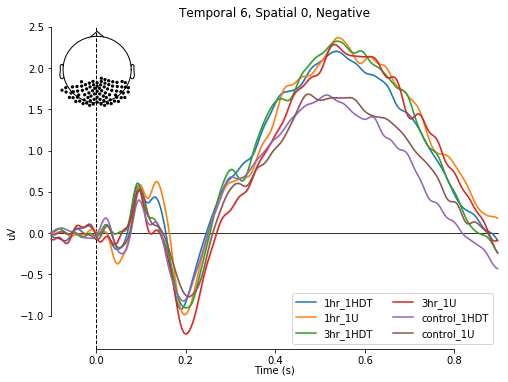

In [235]:
def plotElectrodesForConditions(electrodes, conditions, title):
    evoked_dict = dict()
    ct = 0
    for condition in conditions:
        evoked_dict.update( {condition.comment : condition } )
        print(condition)
        ct += ct
    
    eleSet = electrodes
    pick = np.char.mod('E%d', electrodes ).tolist()
    #pick = eleSet
    
    mne.viz.plot_compare_evokeds(evoked_dict, picks=pick, colors=None,
                             linestyles=None, split_legend=False, 
                             show_legend='lower right', show_sensors='upper left', 
                             title=title)
    
    #0,2,4,6,8,10
ele1 = mycomponents.get('T5S0_Pos').tolist()
np.char.mod('E%d', ele1 ).tolist()
plotElectrodesForConditions(ele1, allEEGdata[::2], title="Temporal 6, Spatial 0, Negative")

<Evoked  |  '1hr_1HDT' (mean, N=1), [-0.1, 0.896] sec, 257 ch, ~1.2 MB>
<Evoked  |  '1hr_1U' (mean, N=1), [-0.1, 0.896] sec, 257 ch, ~1.2 MB>
<Evoked  |  '3hr_1HDT' (mean, N=1), [-0.1, 0.896] sec, 257 ch, ~1.2 MB>
<Evoked  |  '3hr_1U' (mean, N=1), [-0.1, 0.896] sec, 257 ch, ~1.2 MB>
<Evoked  |  'control_1HDT' (mean, N=1), [-0.1, 0.896] sec, 257 ch, ~1.2 MB>
<Evoked  |  'control_1U' (mean, N=1), [-0.1, 0.896] sec, 257 ch, ~1.2 MB>


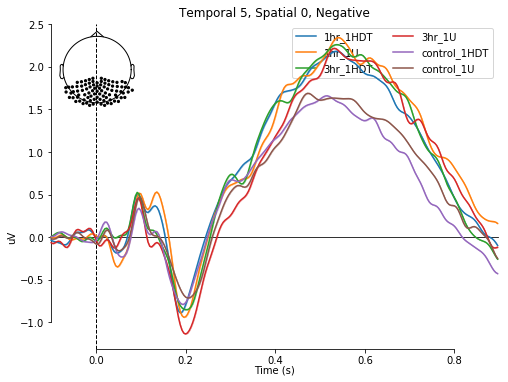

<Evoked  |  '1hr_1HDT' (mean, N=1), [-0.1, 0.896] sec, 257 ch, ~1.2 MB>
<Evoked  |  '1hr_2HDT' (mean, N=1), [-0.1, 0.896] sec, 257 ch, ~1.2 MB>
<Evoked  |  '3hr_1HDT' (mean, N=1), [-0.1, 0.896] sec, 257 ch, ~1.2 MB>
<Evoked  |  '3hr_2HDT' (mean, N=1), [-0.1, 0.896] sec, 257 ch, ~1.2 MB>
<Evoked  |  'control_1HDT' (mean, N=1), [-0.1, 0.896] sec, 257 ch, ~1.2 MB>
<Evoked  |  'control_2HDT' (mean, N=1), [-0.1, 0.896] sec, 257 ch, ~1.2 MB>


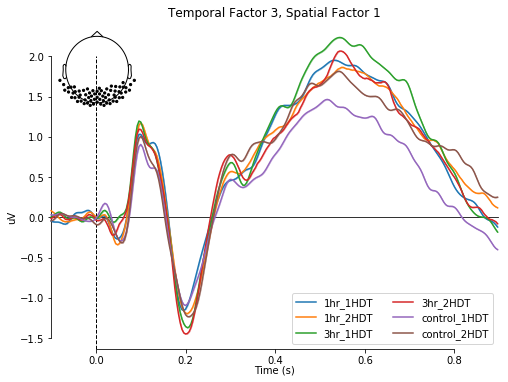

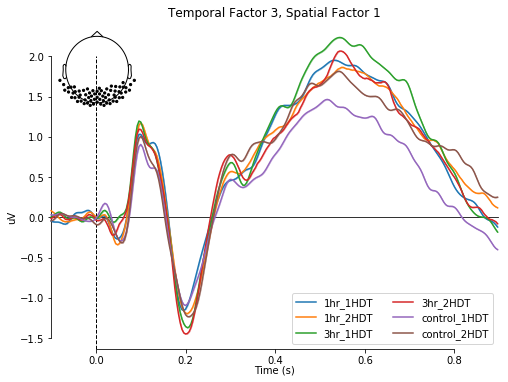

In [189]:
#https://mne-tools.github.io/dev/auto_tutorials/evoked/plot_visualize_evoked.html#sphx-glr-auto-tutorials-evoked-plot-visualize-evoked-py

evoked_dict = dict()
ct = 0
for condition in allEEGdata[:2] + allEEGdata[4:6] + allEEGdata[8:10]:
    evoked_dict.update( {condition.comment : condition } )
    print(condition)
    ct += ct

tf=3
sf=1
eleSet = '''
91  92  93  94  95 102 103 104 105 106 107 108 111 112 113 114 115 116
 117 120 121 122 123 124 125 126 127 133 134 135 136 137 138 139 145 146
 147 148 149 150 151 156 157 158 159 160 161 165 166 167 168 169 170 174
 175 176 177 178 187 188 189 190 191 199 200 201 208 209 216
 '''
eleSet = np.char.mod('E%s', eleSet.split() )
#will average the electrodes chosen!  Woot!
#pick = ['E2','E3', 'E4', 'E5']
pick = eleSet.tolist()

mne.viz.plot_compare_evokeds(evoked_dict, picks=pick, colors=None,
                             linestyles=None, split_legend=False, 
                             show_legend='lower right', show_sensors='upper left', 
                             title='Temporal Factor {}, Spatial Factor {}'.format(tf,sf))


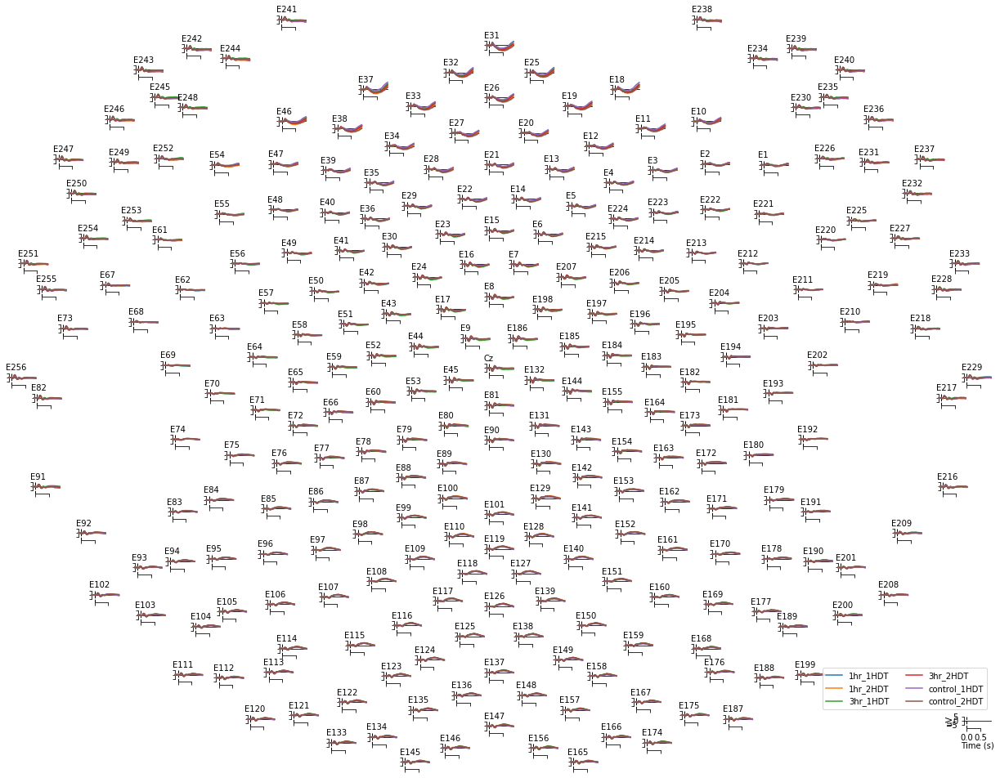

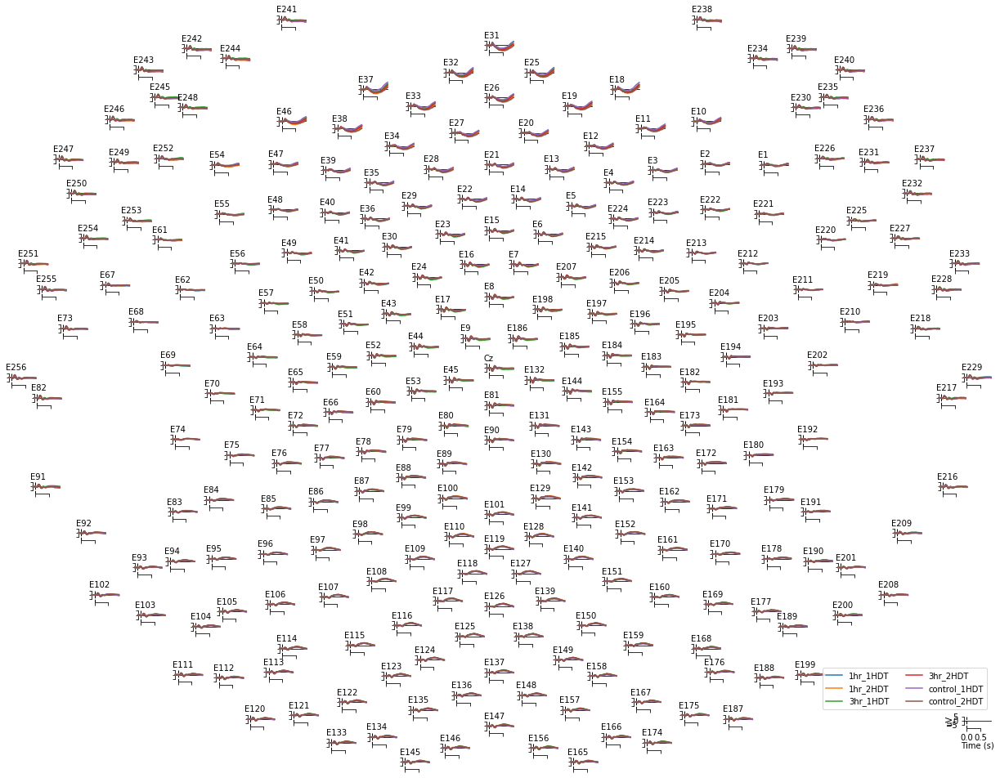

In [199]:
#does a small topoplot of the channels you want
mne.viz.plot_compare_evokeds(evoked_dict, picks="eeg", colors=None,
                             linestyles=None, split_legend=False,
                             axes="topo")

In [ ]:
EEGnames